##Simulacion Pendulo Doble
**Manuela Guisao y Nicolas Zapata**

El péndulo doble es un sistema físico fáscinante, consiste en dos pendulos acoplados, los cuales tienen un comportamiento no lineal y "caotico".
En este proyecto nos enfocamos en la programación de la ecuacion de movimiento del pendulo doble en un sistema ideal, utilizando metodos numericos para poder simular su dinámica compleja. A través de esta simulación podemos notar como las condiciones iniciales que se le de puede cambiar por mucho la dinámica de movimiento y trancisión al caos.

##ecuaciones de movimiento

\begin{equation}
\frac{d\theta_1}{dt} = \omega_1 \\
\frac{d\theta_2}{dt} = \omega_2
\end{equation}
   
\begin{equation}
\frac{d\omega_1}{dt} = \frac{-g(2 m_1+m_2)\sin(\theta)-m_2g\sin(\theta_1-2\theta_2)- 2\sin(\theta_1-\theta_2)m_2(ω^2_2L_2+ω^2_1L_1cos(\theta_1-\theta_2))}{L_1(2m_1+m_2-m_2cos(2\theta_1-2\theta_2))}
\end{equation}

\begin{equation}
\frac{d\omega_2}{dt} = \frac{2sin(\theta_1-θ_2)(\omega^2_1L_1(m_1+m_2)+g(m_1-+m_2)\cos \theta_1+ω^2_2L_1m_2cos(θ_1-\theta_2))}{L_2(2m_1+m_2-m_2cos(2\theta_1-2\theta_2))}
\end{equation}


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

In [ ]:
#parametros iniciales
l1= 0.8       #longitud cuerda 1
l2= 0.2       #longitud cuerda 2
theta01= np.pi/20    #angulo inicial primer pendulo
theta02 = np.pi/4  #angulo iniical segundo pendulo
omega01= 0   #velocidad inicial primer pendulo
omega02= 0    #velocidad inicial segundo pendulo
m1= 0.31    #masa primer pendulo
m2 =0.5      #masa segundo pendulo
g= 9.81    #constante gravitacional
fps= 30      #frames por segundo
tmax= 20 #tiempo final de la simulación
Ivalues= [theta01,theta02,omega01,omega02]

In [ ]:
def pendulum(t, y, l1, l2, m1, m2, g):

  theta1, theta2, omega1, omega2 = y

  dtheta1_dt = omega1
  dtheta2_dt = omega2

  domega1_dt = (-g * (2 * m1 + m2) * np.sin(theta1) -
                m2 * g * np.sin(theta1 - 2 * theta2) -
                2 * np.sin(theta1 - theta2) * m2 *
                (omega2**2 * l2 + omega1**2 * l1 * np.cos(theta1 - theta2))) / \
                (l1 * (2 * m1 + m2 - m2 * np.cos(2 * theta1 - 2 * theta2)))

  domega2_dt = (2 * np.sin(theta1 - theta2) *
                (omega1**2 * l1 * (m1 + m2) + g * (m1 + m2) * np.cos(theta1) +
                omega2**2 * l2 * m2 * np.cos(theta1 - theta2))) / \
                (l2 * (2 * m1 + m2 - m2 * np.cos(2 * theta1 - 2 * theta2)))

  return [dtheta1_dt, dtheta2_dt, domega1_dt, domega2_dt]


In [ ]:
sol = solve_ivp(pendulum, [0, tmax], Ivalues, args=(l1, l2, m1, m2, g),t_eval=np.linspace(0, tmax, fps * tmax))
funtheta1 = sol.y[0]
funtheta2 = sol.y[1]
funomega1 = sol.y[2]
funomega2 = sol.y[3]
time = sol.t


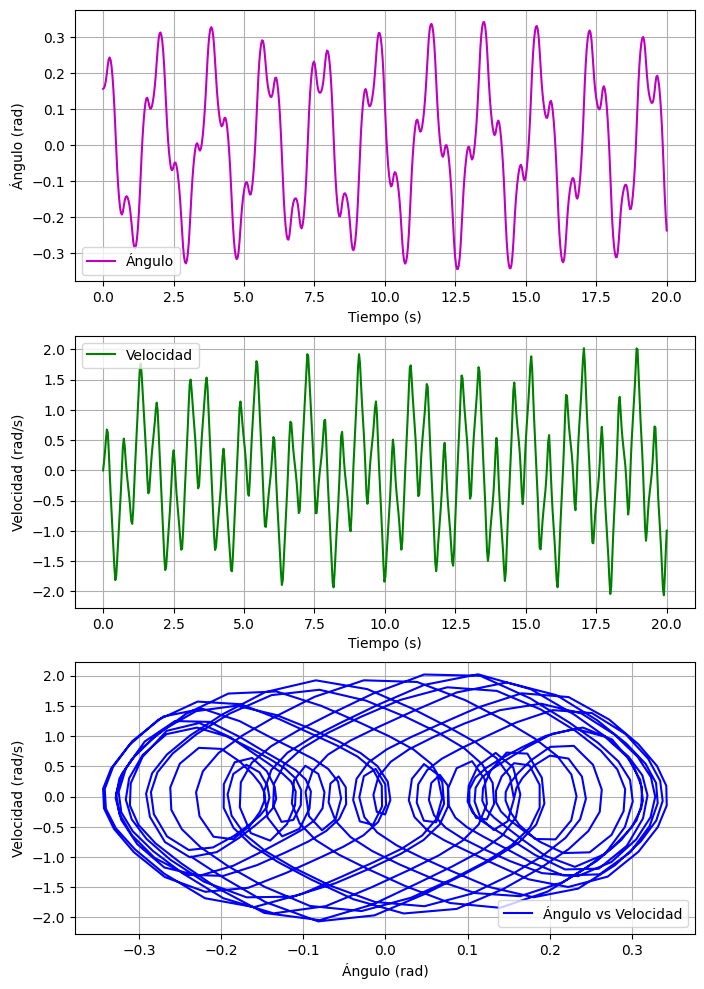

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

axs[0].plot(time, funtheta1, label='Ángulo', color='m')
axs[0].set_ylabel('Ángulo (rad)')
axs[0].set_xlabel('Tiempo (s)')
axs[0].legend()
axs[0].grid()

axs[1].plot(time, funomega1, label='Velocidad', color='g')
axs[1].set_ylabel('Velocidad (rad/s)')
axs[1].set_xlabel('Tiempo (s)')
axs[1].legend()
axs[1].grid()

axs[2].plot(funtheta1, funomega1, label='Ángulo vs Velocidad', color='b')
axs[2].set_ylabel('Velocidad (rad/s)')
axs[2].set_xlabel('Ángulo (rad)')
axs[2].legend()
axs[2].grid()

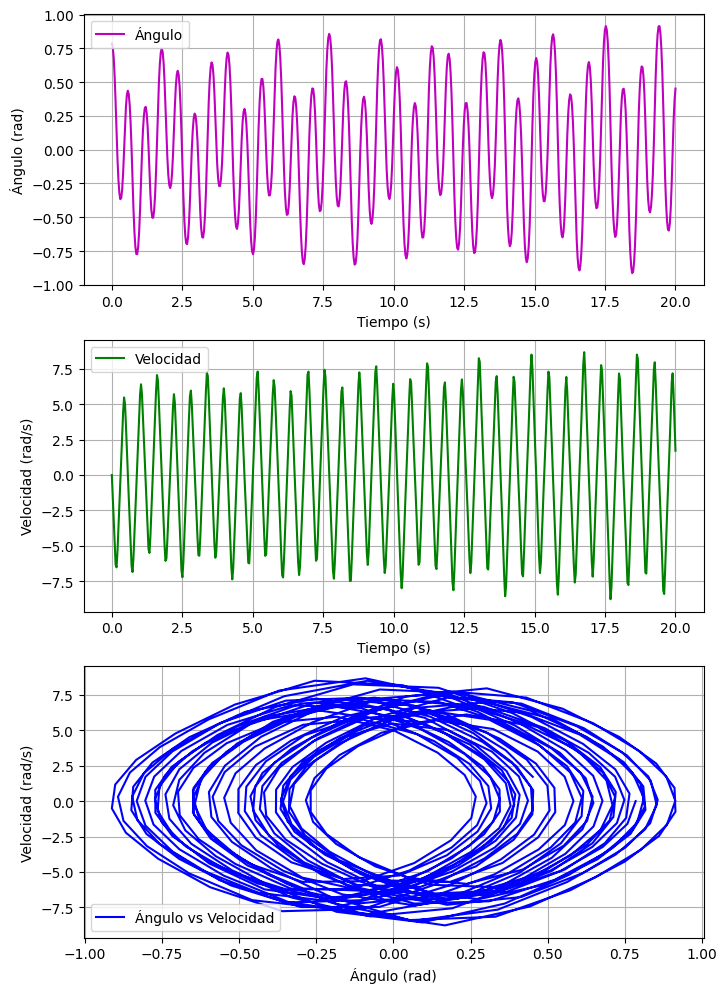

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

axs[0].plot(time, funtheta2, label='Ángulo', color='m')
axs[0].set_ylabel('Ángulo (rad)')
axs[0].set_xlabel('Tiempo (s)')
axs[0].legend()
axs[0].grid()

axs[1].plot(time, funomega2, label='Velocidad', color='g')
axs[1].set_ylabel('Velocidad (rad/s)')
axs[1].set_xlabel('Tiempo (s)')
axs[1].legend()
axs[1].grid()

axs[2].plot(funtheta2, funomega2, label='Ángulo vs Velocidad', color='b')
axs[2].set_ylabel('Velocidad (rad/s)')
axs[2].set_xlabel('Ángulo (rad)')
axs[2].legend()
axs[2].grid()

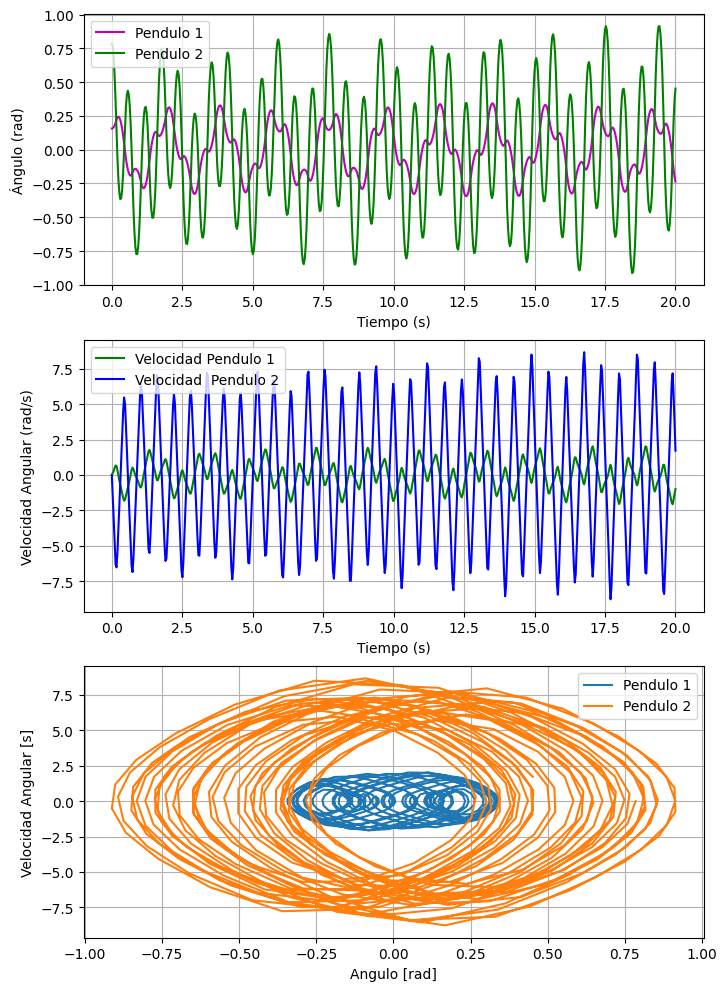

In [ ]:
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

axs[0].plot(time, funtheta1, label='Pendulo 1', color='m')
axs[0].plot(time, funtheta2, label='Pendulo 2', color='g')
axs[0].set_ylabel('Ángulo (rad)')
axs[0].set_xlabel('Tiempo (s)')
axs[0].legend()
axs[0].grid()

axs[1].plot(time, funomega1, label='Velocidad Pendulo 1', color='g')
axs[1].plot(time, funomega2, label='Velocidad  Pendulo 2', color='b')
axs[1].set_ylabel('Velocidad Angular (rad/s)')
axs[1].set_xlabel('Tiempo (s)')
axs[1].legend()
axs[1].grid()



plt.plot(funtheta1,funomega1, label='Pendulo 1')
plt.plot(funtheta2,funomega2, label='Pendulo 2')
plt.xlabel('Angulo [rad]')
plt.ylabel('Velocidad Angular [s]')
plt.legend()
plt.grid()
plt.show()

In [ ]:

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from IPython.display import HTML


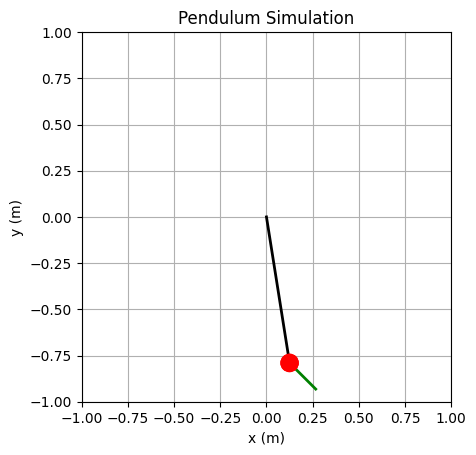

In [ ]:

#parametros iniciales
l1= 0.8       #longitud cuerda 1
l2= 0.2       #longitud cuerda 2
theta01= np.pi/20     #angulo inicial primer pendulo
theta02 = np.pi/4  #angulo iniical segundo pendulo
omega01= 0.0    #velocidad inicial primer pendulo
omega02= 0.0    #velocidad inicial segundo pendulo
m1= 0.31    #masa primer pendulo
m2 =0.5      #masa segundo pendulo
g= 9.81    #constante gravitacional
fps= 30      #frames por segundo
tmax= 15  #tiempo final de la simulación
Ivalues= [theta01,theta02,omega01,omega02]

# solve the ODE, 30 fps
sol = solve_ivp(pendulum, [0, tmax], Ivalues,method="BDF", max_step=0.01, atol = 0.01, rtol = 0.01, args=(l1, l2, m1, m2, g),t_eval=np.linspace(0, tmax, fps * tmax))
funtheta1 = sol.y[0]
funtheta2 = sol.y[1]
funomega1 = sol.y[2]
funomega2 = sol.y[3]
time = sol.t




# create an animation of the pendulum swining with Matplotlib

def pend_pos(theta01,theta02):
    x01,y01 = (l1*np.sin(theta01), -l1*np.cos(theta01))
    x02,y02 = (x01+(l2*np.sin(theta02)), y01-(l2*np.cos(theta02)))
    return (x01, y01, x02, y02)

# create figure
fig = plt.figure()
ax = fig.add_subplot(aspect='equal')
ax.set_xlim(-(l1+l2), (l1+l2))
ax.set_ylim(-(l1+l2), (l1+l2))
ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_title('Pendulum Simulation')
ax.grid()

x01, y01,x02, y02 = pend_pos(theta01,theta02)

line1, = ax.plot([0, x01], [0, y01], lw=2, c='k')
line2, = ax.plot([x01, x02], [y01, y02], lw=2, c='g')
circle1 = ax.add_patch(plt.Circle(pend_pos(theta01,theta02), 0.05, fc='r', zorder=3))
circle2 = ax.add_patch(plt.Circle(pend_pos(theta01,theta02), 0.05, fc='r', zorder=3))

# animate each frame "i"
def animate(i):
    x1,y1,x2,y2 = pend_pos(funtheta1[i],funtheta2[i])
    line1.set_data([0, x1], [0, y1])
    line2.set_data([x1, x2], [y1, y2])
    circle1.set_center((x1, y1))
    circle2.set_center((x2, y2))



In [ ]:

# save a video: 30 fps
ani = animation.FuncAnimation(fig, animate, frames=len(time));
#ffmpeg_writer = animation.FFMpegWriter(fps=fps)
#ani.save('phase_diagram.mp4', writer=ffmpeg_writer)

HTML(ani.to_jshtml())


Energía potencial:
\begin{equation}
V = m_1gy_1 + m_2gy_2
\end{equation}

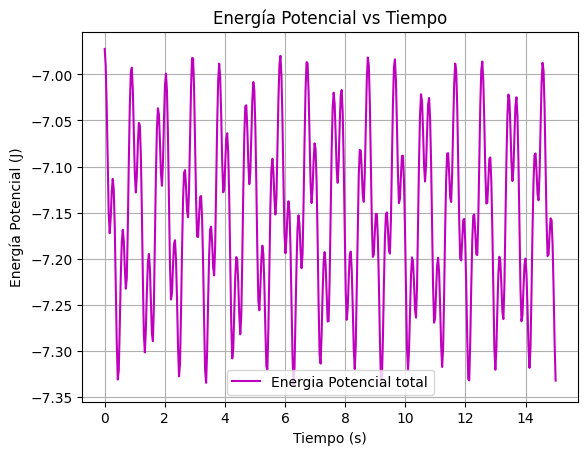

In [ ]:
xsys=np.zeros((len(time),4))
for i in range(len(time)):
  xsys[i] =pend_pos(funtheta1[i],funtheta2[i])
x1= xsys[:,0]
y1= xsys[:,1]
x2= xsys[:,2]
y2= xsys[:,3]

def potenergy(t, y, l1, l2, m1, m2, g):
  y1, y2 = y
  V = m1*g*y1 + m2*g*y2
  return V
Epot=np.zeros((len(time)))
for i in range(len(time)):
  Epot[i]=(potenergy(time[i], [y1[i], y2[i]], l1, l2, m1, m2, g))
plt.plot(time,Epot, label = 'Energia Potencial total', color='m')
plt.legend()
plt.xlabel('Tiempo (s)')
plt.ylabel('Energía Potencial (J)')
plt.title('Energía Potencial vs Tiempo')
plt.grid()
plt.show()

In [ ]:
print(y1[0],y2[0])
potenergy(time[0], [y1[0], y2[0]], l1, l2, m1, m2, g)

-0.7901506724761103 -0.9315720287134198


-6.972288010906423

In [ ]:
def kineticenergy(Ivalues, l1, l2, m1, m2):
    theta01, theta02, omega01, omega02 = Ivalues
    T = m1 * (l1 * omega01)**2 / 2 + m2 * ((l1 * omega01)**2 + (l2 * omega02)**2+2*l1*l2*omega01*omega02*np.cos(theta01-theta02)) / 2
    return T
Ekin=np.zeros(len(time))
for i in range(len(time)):
  Ekin[i]=kineticenergy([funtheta1[i],funtheta1[i],funomega1[i],funomega2[i]], l1, l2, m1, m2)

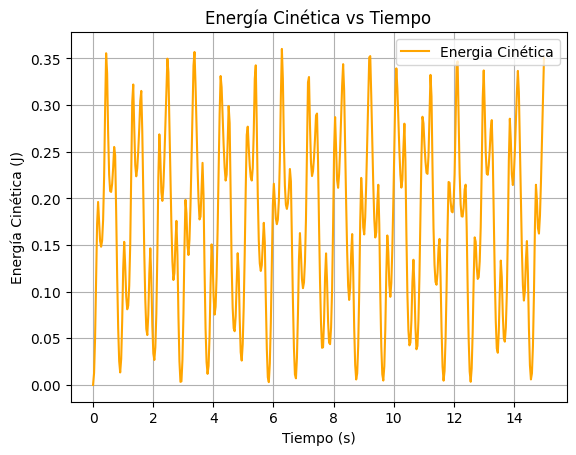

In [ ]:
plt.plot(time, Ekin, label='Energia Cinética', color='orange')
plt.legend()
plt.xlabel('Tiempo (s)')
plt.ylabel('Energía Cinética (J)')
plt.title('Energía Cinética vs Tiempo')
plt.grid()
plt.show()

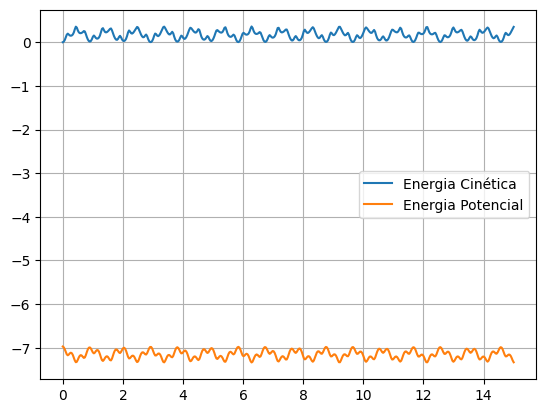

In [ ]:
plt.plot(time, Ekin, label='Energia Cinética')
plt.plot(time, Epot, label='Energia Potencial')
plt.legend()
plt.grid()
plt.show()

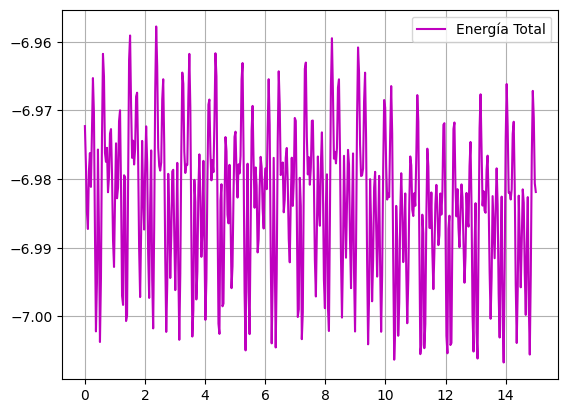

In [ ]:
Lagran= Ekin + Epot
plt.plot(time, Lagran, label='Energía Total', color='m')
plt.legend()
plt.grid()
plt.show()